Downloaded yolov3.weights
Downloaded yolov3.cfg
Downloaded coco.names


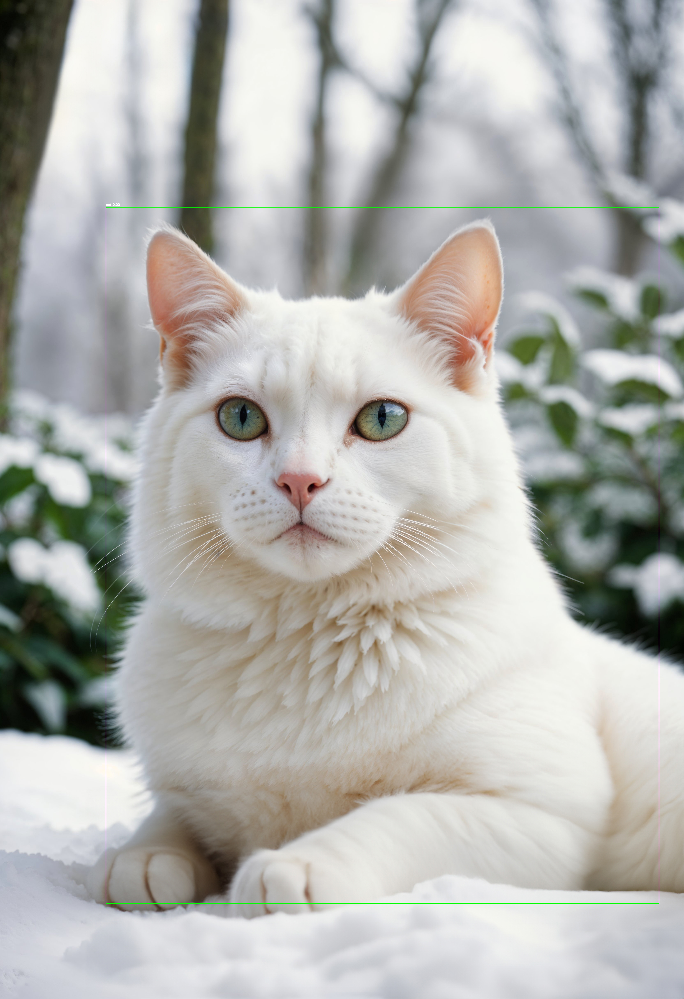

In [ ]:
import cv2
import numpy as np
import urllib.request
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow  # Correct import for displaying images in Colab

# URLs to download the YOLO files
yolo_weights_url = "https://pjreddie.com/media/files/yolov3.weights"
yolo_cfg_url = "https://github.com/pjreddie/darknet/blob/master/cfg/yolov3.cfg?raw=true"
yolo_names_url = "https://raw.githubusercontent.com/pjreddie/darknet/master/data/coco.names"

# Local paths to save the YOLO files
yolo_weights_path = "yolov3.weights"
yolo_cfg_path = "yolov3.cfg"
yolo_names_path = "coco.names"

# Download YOLO files if not already present
def download_file(url, path):
    try:
        urllib.request.urlretrieve(url, path)
        print(f"Downloaded {path}")
    except Exception as e:
        print(f"Error downloading {path}: {e}")

# Download the required files
download_file(yolo_weights_url, yolo_weights_path)
download_file(yolo_cfg_url, yolo_cfg_path)
download_file(yolo_names_url, yolo_names_path)

# Load YOLO model
net = cv2.dnn.readNet(yolo_weights_path, yolo_cfg_path)
layer_names = net.getLayerNames()
output_layers = [layer_names[i - 1] for i in net.getUnconnectedOutLayers()]

# Load class labels (COCO dataset)
with open(yolo_names_path, 'r') as f:
    classes = [line.strip() for line in f.readlines()]

# Load image (change this to your image path)
image_path = '/content/adorable-cat-lifestyle.jpg'  # Replace with your image path
image = cv2.imread(image_path)

# Check if the image was loaded correctly
if image is None:
    print(f"Error: Image at {image_path} not found or failed to load.")
    exit()

height, width, channels = image.shape

# Prepare image for YOLO
blob = cv2.dnn.blobFromImage(image, 0.00392, (416, 416), (0, 0, 0), True, crop=False)
net.setInput(blob)
outs = net.forward(output_layers)

# Post-processing to extract bounding boxes, confidence, and class IDs
class_ids = []
confidences = []
boxes = []

for out in outs:
    for detection in out:
        scores = detection[5:]
        class_id = np.argmax(scores)
        confidence = scores[class_id]

        if confidence > 0.5:  # Filter weak detections
            center_x = int(detection[0] * width)
            center_y = int(detection[1] * height)
            w = int(detection[2] * width)
            h = int(detection[3] * height)

            # Calculate the top-left corner of the bounding box
            x = int(center_x - w / 2)
            y = int(center_y - h / 2)

            boxes.append([x, y, w, h])
            confidences.append(float(confidence))
            class_ids.append(class_id)

# Apply Non-Maximum Suppression (NMS) to remove duplicate boxes
indices = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)

# Ensure the indices are not empty
if len(indices) > 0:
    indices = indices.flatten()
else:
    print("No objects detected.")
    indices = []

# Draw bounding boxes and labels on the image
for i in indices:
    x, y, w, h = boxes[i]
    label = str(classes[class_ids[i]])  # Get the label
    confidence = confidences[i]

    # Draw rectangle around detected object
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Add label and confidence score
    label_text = f"{label} {confidence:.2f}"
    cv2.putText(image, label_text, (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)  # White color for text

# Display the result using cv2_imshow in Colab
cv2_imshow(image)



